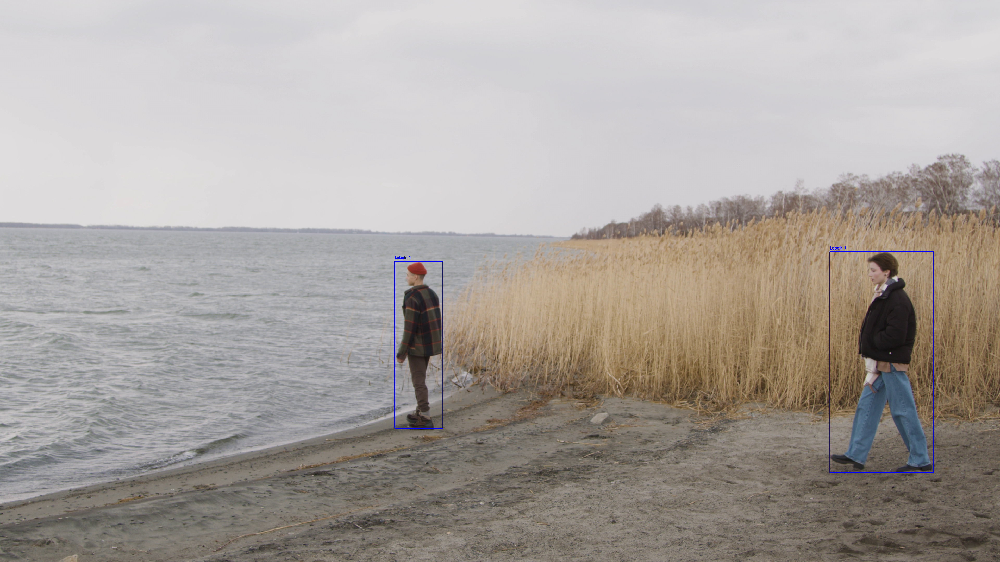

error: OpenCV(4.11.0) /io/opencv/modules/highgui/src/window.cpp:1367: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvWaitKey'


In [3]:
import cv2
import torch
import torchvision.transforms as T
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.utils import draw_bounding_boxes
from google.colab.patches import cv2_imshow
# Загрузка предобученной модели
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()  # Переключаем модель в режим оценки

# Определяем трансформации для входного изображения
transform = T.Compose([
    T.ToTensor(),
])

# Функция для обработки видео
def detect_objects_in_video(video_path):
    cap = cv2.VideoCapture(video_path)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Преобразование изображения в тензор
        image = transform(frame).unsqueeze(0)  # Добавляем размер батча

        # Выполнение обнаружения объектов
        with torch.no_grad():
            predictions = model(image)

        # Обработка результатов
        boxes = predictions[0]['boxes']
        scores = predictions[0]['scores']
        labels = predictions[0]['labels']

        # Фильтрация по порогу уверенности (например, 0.5)
        threshold = 0.5
        boxes = boxes[scores > threshold].cpu().numpy()
        labels = labels[scores > threshold].cpu().numpy()

        # Визуализация результатов
        for box, label in zip(boxes, labels):
            x1, y1, x2, y2 = box.astype(int)
            cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 0, 0), 2)
            cv2.putText(frame, f'Label: {label}', (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        # Отображение результата
        cv2_imshow(frame)

        # Выход при нажатии клавиши 'q'
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    cap.release()
    cv2.destroyAllWindows()

# Укажите путь к вашему видеофайлу
video_path = '/content/1112645_Approach_Winter-clothes_3840x2160.mp4'
detect_objects_in_video(video_path)
